**Explanation**

## Reputation-Based Multipartite Ranking

This notebook implements a multipartite ranking system using user clusters and reputation to improve item ranking fairness and robustness.

### **How it Works**

1.  **Cluster Rankings:**
    * Initial item rankings are computed within each user cluster, requiring minimum rating counts.
    * Clusters smaller than a given threshold are assigned to the Complementary cluster.
2.  **Intra-Cluster Reputation:**
    * Within each cluster reputations are calculated, weighted by cluster size.
3.  **Convergence & Visualization:**
    * The system iterates until rankings converge.
4.  **Weighted Average:**
    * A weighted average ranking for each item is computed, using the cluster sizes as weight.
5.  **Top 3 Clusters**
    * A visualization of the distribution of rankings on the top 3 clusters is provided.

### **This notebook will:**

* Cluster users,
* Compute cluster-specific rankings with thresholds,
* Calculate cluster reputations,
* Generate weighted average rankings using reputation,
* Visualize distribution of rankings.

**1.    Imports**

In [3]:
import pandas as pd
import numpy as np
import networkx as nx
import zlib
import pickle
import os
import matplotlib.pyplot as plt
from itertools import combinations
import sys
import math
from collections import Counter
from scipy.stats import zscore
from scipy.stats import kendalltau


compressed_sizes = {}


**2.    Load dataset**

In [4]:
# Define dataset path
file_path = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/normalized_ratings.dat"

# Load dataset
df = pd.read_csv(file_path, sep="::", engine="python", names=["UserID", "MovieID", "Rating", "Timestamp", "NormalizedRating"])

# Display first few rows
df.head()

,UserID,MovieID,Rating,Timestamp,NormalizedRating
0,1,1193,5,978300760,1.0
1,1,661,3,978302109,0.6
2,1,914,3,978301968,0.6
3,1,3408,4,978300275,0.8
4,1,2355,5,978824291,1.0


**3.    Dictionary with pre-computed values**

In [5]:
def compute_compressed_sizes(user_ratings):
    
    for user, ratings in user_ratings.items():
        u_string = "".join(f"{k}:{v} " for k, v in sorted(ratings.items()))
        compressed_sizes[user] = len(zlib.compress(u_string.encode()))
    
    return compressed_sizes


**4.    Similarity distances**

In [6]:
def linear_similarity(u, v, user_ratings):
    common_items = set(user_ratings[u].keys()).intersection(set(user_ratings[v].keys()))
    if not common_items:
        return 0  # If no common items, similarity is 0

    diff_sum = sum(abs(user_ratings[u][i] - user_ratings[v][i]) for i in common_items)
    ls_value = 1 - (diff_sum / len(common_items))
    return max(0, ls_value)  # Ensure similarity is non-negative

# Compression Similarity with precomputed sizes
def compression_similarity(u, v, user_ratings):
    u_string = "".join(f"{k}:{v} " for k, v in sorted(user_ratings[u].items()))
    v_string = "".join(f"{k}:{v} " for k, v in sorted(user_ratings[v].items()))
    c_uv = len(zlib.compress((u_string + v_string).encode()))
    c_u = compressed_sizes[u]
    c_v = compressed_sizes[v]
    return 1 - (c_uv - min(c_u, c_v)) / max(c_u, c_v)

# Kolmogorov Similarity with precomputed sizes
def kolmogorov_similarity(u, v, user_ratings):
    #ordena a priori os ratings dado por cada user
    c_u = compressed_sizes[u]
    c_v = compressed_sizes[v]
    return 1 / (1 + abs(c_u - c_v))

def jaccard_similarity(u, v, user_ratings):
    items_u = set(user_ratings[u].keys())
    items_v = set(user_ratings[v].keys())
    
    intersection = items_u.intersection(items_v)
    union = items_u.union(items_v)
    
    if not union:
        return 0  # Avoid division by zero
    
    return len(intersection) / len(union)

def cosine_similarity(u, v, user_ratings):
    ratings_u = user_ratings[u]
    ratings_v = user_ratings[v]
    common_items = set(ratings_u.keys()).intersection(set(ratings_v.keys()))
    
    if not common_items:
        return 0  # If no common items, similarity is 0

    # Compute dot product and magnitudes
    dot_product = sum(ratings_u[i] * ratings_v[i] for i in common_items)
    magnitude_u = math.sqrt(sum(ratings_u[i] ** 2 for i in ratings_u))
    magnitude_v = math.sqrt(sum(ratings_v[i] ** 2 for i in ratings_v))
    
    if magnitude_u == 0 or magnitude_v == 0:
        return 0  # Avoid division by zero
    
    return dot_product / (magnitude_u * magnitude_v)



**5.    Similarity Graph**

In [7]:
# Compute user similarity matrix and construct graph (with precomputed sizes)
def compute_similarity_matrix(user_ratings, similarity_measure, compressed_sizes, similarity_threshold):
    similarity_graph = nx.Graph()

    # Step 1: Add all users as nodes (ensures isolated users are included)
    similarity_graph.add_nodes_from(user_ratings.keys())

    # Step 2: Compute pairwise similarities and add edges if similarity > 0.99
    for (u, v) in combinations(user_ratings.keys(), 2):
        sim = similarity_measure(u,v,user_ratings)
        if sim > similarity_threshold:
            similarity_graph.add_edge(u, v, weight=sim)

    return similarity_graph

# Detect user clusters from similarity graph
def detect_groups(similarity_graph,min_cluster_size):
    """ Detect user clusters from similarity graph and assign small clusters to a complementary cluster. """
    clusters = list(nx.connected_components(similarity_graph))
    complementary_cluster = set()
    filtered_clusters = []

    for cluster in clusters:
        if len(cluster) < min_cluster_size:
            complementary_cluster.update(cluster)  # Add small clusters to the complementary cluster
        else:
            filtered_clusters.append(cluster)  # Keep large clusters as they are

    if complementary_cluster:
        filtered_clusters.append(complementary_cluster)  # Add complementary cluster if it has users

    filtered_cluster_sizes = [len(group) for group in filtered_clusters]
    # print("Number of clusters: ", len(filtered_clusters))
    # print("complementary_cluster: ", len(complementary_cluster))
    mean_size = np.mean(filtered_cluster_sizes)
    std_size = np.std(filtered_cluster_sizes)
    z_score = (len(complementary_cluster) - mean_size) / std_size if std_size > 0 else float('inf')
    # print("z_score: ", z_score)

    return filtered_clusters

**6.    Reputation-based intra-clustering**

In [8]:
def compute_cluster_ratings(dataset, user_groups):
    """ Compute initial ratings per cluster based only on the items rated by at least 5 users in the cluster. """
    cluster_item_ratings = {}

    # Iterate through each user cluster
    for cluster_idx, user_set in enumerate(user_groups, start=1): 
        cluster_df = dataset[dataset["UserID"].isin(user_set)]  # Filter dataset to only include users in the cluster
        item_rating_counts = cluster_df["MovieID"].value_counts()  # Count ratings per item
        
        # Filter items that have at least x ratings
        #TODO
        valid_items = item_rating_counts[item_rating_counts >= 1].index  

        # Compute the mean only for valid items
        filtered_avg_ratings = cluster_df[cluster_df["MovieID"].isin(valid_items)].groupby("MovieID")["NormalizedRating"].mean().to_dict()

        cluster_item_ratings[cluster_idx] = filtered_avg_ratings

    return cluster_item_ratings

def compute_reputation_adjusted_ratings_optimized(dataset, cluster_item_ratings, user_groups, lambda_factor=0.95, tol=1e-2, max_iter=50):
    clusters = cluster_item_ratings.keys()
    prev_ratings = {c: cluster_item_ratings[c].copy() for c in clusters}
    user_reputations_by_cluster = {}

    for cluster in clusters:
        user_reputations_by_cluster[cluster] = {user: 1.0 for user in user_groups[cluster - 1]}  # Init reputations

    for _ in range(max_iter):
        converged = True
        new_ratings = {}

        for cluster in clusters:
            cluster_users = user_groups[cluster - 1]
            cluster_df = dataset[dataset["UserID"].isin(cluster_users)]
            user_grouped = dict(tuple(cluster_df.groupby("UserID")))
            item_grouped = dict(tuple(cluster_df.groupby("MovieID")))
            item_ratings = prev_ratings[cluster]
            user_reputation = user_reputations_by_cluster[cluster]

            # Update reputations
            for user, user_df in user_grouped.items():
                ratings = user_df[["MovieID", "NormalizedRating"]].values
                errors = [
                    abs(rating - item_ratings[item])
                    for item, rating in ratings if item in item_ratings
                ]
                avg_error = np.mean(errors) if errors else 0
                user_reputation[user] = max(0, 1 - lambda_factor * avg_error)

            # Update item ratings
            new_item_ratings = {}
            for item, item_df in item_grouped.items():
                users = item_df["UserID"].values
                ratings = item_df["NormalizedRating"].values
                weights = np.array([user_reputation.get(u, 0) for u in users])
                if weights.sum() > 0:
                    new_item_ratings[item] = min(1.0, np.dot(weights, ratings) / weights.sum())
                else:
                    new_item_ratings[item] = item_ratings.get(item, 0)

                # Check convergence
                if abs(new_item_ratings[item] - item_ratings.get(item, 0)) > tol:
                    converged = False

            new_ratings[cluster] = new_item_ratings
            user_reputations_by_cluster[cluster] = user_reputation

        prev_ratings = new_ratings

        if converged:
            break

    return prev_ratings, user_reputations_by_cluster


def compute_weighted_average_cluster_ratings(cluster_item_ratings, user_groups):
    """Compute weighted average ratings for each item across clusters using cluster size as weight."""
    item_weighted_sums = {}
    item_total_weights = {}
    
    # Iterate over clusters and their item ratings
    for cluster_idx, item_ratings in cluster_item_ratings.items():
        cluster_size = len(user_groups[cluster_idx - 1])  # Cluster index is 1-based, user_groups is 0-based
        
        for item, rating in item_ratings.items():
            if item not in item_weighted_sums:
                item_weighted_sums[item] = 0
                item_total_weights[item] = 0
            
            # Add weighted contribution
            item_weighted_sums[item] += rating * cluster_size
            item_total_weights[item] += cluster_size
    
    # Compute weighted averages and round to the nearest decimal place
    weighted_averages = {item: round(item_weighted_sums[item] / item_total_weights[item], 1) for item in item_weighted_sums}
    
    return weighted_averages


def round_ratings_to_one_decimal(new_ratings):
    """Round all item ratings to the nearest one decimal place."""
    return {cluster: {item: round(rating, 1) for item, rating in items.items()} for cluster, items in new_ratings.items()}




**7.    Plot Generation**

In [9]:
def plot_top_3_clusters(cluster_ratings):
    """Plot a bar chart showing the rating distribution for the three largest clusters with bins."""
    # Sort clusters by size (number of items rated) in descending order
    top_clusters = sorted(cluster_ratings.keys(), key=lambda c: len(cluster_ratings[c]), reverse=True)[:3]

    # Define bins from 0.1 to 1.0 (inclusive)
    bins = np.arange(0.05, 1.05, 0.1)  # Bin centers
    bin_labels = [round(b, 1) for b in np.arange(0.1, 1.1, 0.1)]  # Labels for x-axis

    plt.figure(figsize=(12, 5))

    # Adjust vertical position offset for each cluster
    vertical_offset = 0.0

    for cluster in top_clusters:
        # Flatten ratings in the cluster
        ratings = list(cluster_ratings[cluster].values())

        # Digitize ratings into bins
        bin_indices = np.digitize(ratings, bins, right=True)
        bin_counts = Counter(bin_indices)

        # Create an aligned count array
        counts = [bin_counts[i + 1] if i + 1 in bin_counts else 0 for i in range(len(bin_labels))]

        # Plot the bar chart for the cluster, adjusting the position of the bars
        plt.bar(bin_labels, counts, width=0.07, alpha=0.6, label=f'Cluster {cluster}', bottom=vertical_offset)

        # Add value labels with a vertical offset for readability
        for i, count in enumerate(counts):
            if count > 0:
                plt.text(bin_labels[i], count + vertical_offset + 0.5, str(count), ha='center', fontsize=10)

        # Update the vertical offset for the next cluster
        vertical_offset += max(counts) + 2  # Adjust the offset based on the max count in the current cluster

    plt.xlabel("Item Rating (Binned from 0.1 to 1.0)")
    plt.ylabel("Number of Items")
    plt.title("Compression 0.4 | reputation threshold 0.95")
    plt.xticks(bin_labels)
    plt.legend()
    plt.show()



def plot_weighted_average_distribution(weighted_average_dict):
    """Plot a bar chart showing the distribution of weighted average ratings with bins from 0.1 to 1.0."""
    # Flatten weighted averages
    ratings = list(weighted_average_dict.values())

    # Define bins from 0.1 to 1.0
    bins = np.arange(0.05, 1.05, 0.1)  # Bin centers
    bin_labels = [round(b, 1) for b in np.arange(0.1, 1.1, 0.1)]  # Labels for x-axis

    # Digitize ratings into bins
    bin_indices = np.digitize(ratings, bins, right=True)
    bin_counts = Counter(bin_indices)

    # Create an aligned count array
    counts = [bin_counts[i + 1] if i + 1 in bin_counts else 0 for i in range(len(bin_labels))]

    # Plot the bar chart
    plt.figure(figsize=(10, 5))
    plt.bar(bin_labels, counts, width=0.07, color='blue', alpha=0.7)

    # Add value labels
    for i, count in enumerate(counts):
        if count > 0:
            plt.text(bin_labels[i], count + 0.5, str(count), ha='center', fontsize=10)

    plt.xlabel("Weighted Average Rating (Binned from 0.1 to 1.0)")
    plt.ylabel("Number of Items")
    plt.title("Distribution of Weighted Average Ratings (Binned)")
    plt.xticks(bin_labels)
    plt.show()

**8.    Data Preprocessing**

In [10]:
# Prepare user ratings
user_ratings = {user: dict(zip(group["MovieID"], group["NormalizedRating"])) for user, group in df.groupby("UserID")}

print("\nuser_ratings: ", user_ratings)
# Compute or load compressed sizes
compressed_sizes = compute_compressed_sizes(user_ratings)
print("comprimido")


user_ratings:  {1: {1193: 1.0, 661: 0.6, 914: 0.6, 3408: 0.8, 2355: 1.0, 1197: 0.6, 1287: 1.0, 2804: 1.0, 594: 0.8, 919: 0.8, 595: 1.0, 938: 0.8, 2398: 0.8, 2918: 0.8, 1035: 1.0, 2791: 0.8, 2687: 0.6, 2018: 0.8, 3105: 1.0, 2797: 0.8, 2321: 0.6, 720: 0.6, 1270: 1.0, 527: 1.0, 2340: 0.6, 48: 1.0, 1097: 0.8, 1721: 0.8, 1545: 0.8, 745: 0.6, 2294: 0.8, 3186: 0.8, 1566: 0.8, 588: 0.8, 1907: 0.8, 783: 0.8, 1836: 1.0, 1022: 1.0, 2762: 0.8, 150: 1.0, 1: 1.0, 1961: 1.0, 1962: 0.8, 2692: 0.8, 260: 0.8, 1028: 1.0, 1029: 1.0, 1207: 0.8, 2028: 1.0, 531: 0.8, 3114: 0.8, 608: 0.8, 1246: 0.8}, 2: {1357: 1.0, 3068: 0.8, 1537: 0.8, 647: 0.6, 2194: 0.8, 648: 0.8, 2268: 1.0, 2628: 0.6, 1103: 0.6, 2916: 0.6, 3468: 1.0, 1210: 0.8, 1792: 0.6, 1687: 0.6, 1213: 0.4, 3578: 1.0, 2881: 0.6, 3030: 0.8, 1217: 0.6, 3105: 0.8, 434: 0.4, 2126: 0.6, 3107: 0.4, 3108: 0.6, 3035: 0.8, 1253: 0.6, 1610: 1.0, 292: 0.6, 2236: 1.0, 3071: 0.8, 902: 0.4, 368: 0.8, 1259: 1.0, 3147: 1.0, 1544: 0.8, 1293: 1.0, 1188: 0.8, 3255: 0.8,

**9. Clustering Process**

In [11]:
# Choose similarity measure: linear_similarity, compression_similarity, kolmogorov_similarity
similarity_graph = compute_similarity_matrix(user_ratings, kolmogorov_similarity, compressed_sizes,0.9)

# Get threshold for complementary cluster
num_users = df["UserID"].nunique()
complementary_cluster_threshold = num_users * 0.005

# Detect user clusters from similarity graph
user_groups = detect_groups(similarity_graph, complementary_cluster_threshold)

# Print the number of detected clusters
print(f"User groups: {(user_groups)}")

print("number of user_groups: ", len(user_groups))

#count total number of elements in usergroups
total = 0
for group in user_groups:
    total += len(group)
print("total number of elements in usergroups: ", total)

#biggest user group, average size of user groups
biggest = 0
for group in user_groups:
    if len(group) > biggest:
        biggest = len(group)
print("biggest user group: ", biggest)

average = total / len(user_groups)
print("average size of user groups: ", average)





User groups: [{1282, 4, 5380, 2696, 1674, 6034, 5012, 3222, 1305, 158, 4383, 417, 4259, 421, 4527, 3376, 5810, 317, 5314, 4935, 1615, 1363, 2388, 341, 3027, 1751, 2268, 2527, 3552, 1892, 3176, 2543, 2422, 2295, 5116}, {5635, 12, 2707, 276, 5400, 152, 4254, 5028, 2982, 2347, 5932, 1848, 1596, 1213, 4926, 448, 4672, 2626, 3783, 5579, 2385, 1234, 1236, 2260, 600, 5465, 3421, 2538, 3570, 1907, 5628}, {5377, 1026, 2437, 5384, 2958, 3347, 3740, 5410, 2979, 5416, 554, 2732, 2992, 50, 2612, 3255, 72, 74, 1486, 4047, 3409, 596, 1108, 1238, 5849, 734, 4582, 5101, 4206, 3064, 1405}, {898, 4228, 5381, 2053, 2440, 395, 5388, 5007, 4752, 172, 4270, 3634, 3254, 55, 5690, 3396, 841, 3275, 1612, 4304, 5073, 3542, 3287, 5207, 345, 4703, 4576, 1384, 4202, 1771, 3181, 1520, 4851, 5877, 2813, 1918}, {128, 384, 5122, 3076, 1416, 141, 790, 2582, 283, 2470, 3495, 4008, 171, 4143, 3636, 1336, 5696, 4421, 4427, 2646, 3160, 2399, 3303, 4839, 4073, 5608, 2799, 2673, 2549, 5238, 124}, {640, 4741, 4871, 906, 653, 1

**10. Ranking computation**


cluster_item_ratings:  {1: {1: 0.8, 6: 1.0, 10: 0.6, 11: 1.0, 32: 1.0, 34: 0.9333333333333332, 36: 0.6, 39: 0.7333333333333334, 50: 1.0, 58: 0.8, 66: 0.4, 73: 0.8, 77: 0.8, 110: 0.8250000000000001, 111: 1.0, 112: 0.6, 117: 0.6, 125: 0.8, 159: 0.8, 162: 0.8, 165: 1.0, 170: 0.6, 224: 0.8, 236: 0.8, 239: 0.8, 242: 0.6, 246: 0.9, 260: 0.9428571428571428, 265: 0.8, 266: 0.8, 290: 0.8, 293: 0.8, 296: 0.6, 318: 0.9333333333333332, 320: 0.6, 324: 0.6, 327: 0.8, 329: 0.8, 344: 0.4, 345: 0.5, 350: 0.6, 356: 1.0, 357: 0.6, 363: 0.8, 370: 0.6, 376: 1.0, 380: 1.0, 383: 0.8, 420: 0.4, 457: 0.9, 459: 0.6, 466: 1.0, 480: 0.8, 506: 0.6, 508: 1.0, 527: 0.9333333333333332, 541: 1.0, 549: 0.9, 553: 1.0, 556: 0.8, 558: 0.8, 574: 0.8, 588: 0.7333333333333334, 589: 1.0, 593: 0.8500000000000001, 594: 1.0, 595: 0.6, 596: 0.6, 597: 1.0, 599: 1.0, 608: 0.7, 616: 0.8, 648: 1.0, 681: 0.8, 728: 0.8, 741: 0.6, 778: 1.0, 783: 0.8, 800: 1.0, 832: 0.8, 858: 0.9666666666666667, 879: 0.8, 902: 0.4, 908: 1.0, 912: 0.79999

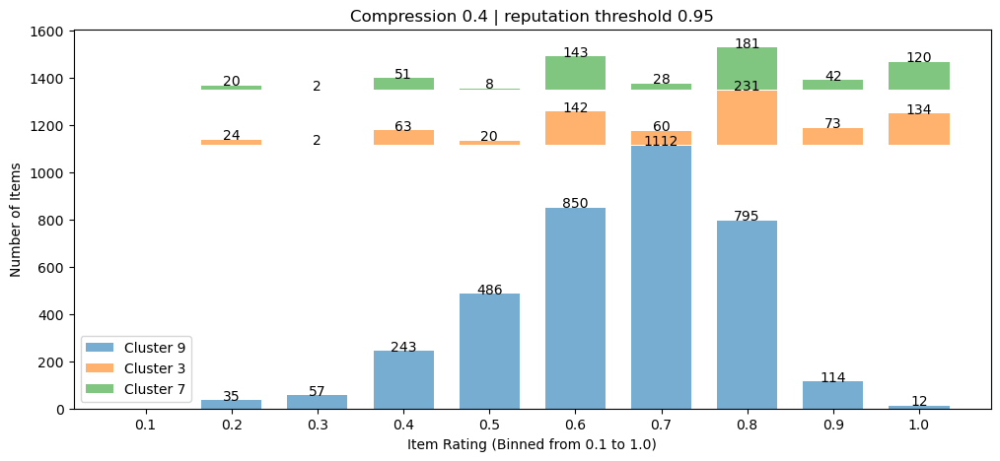

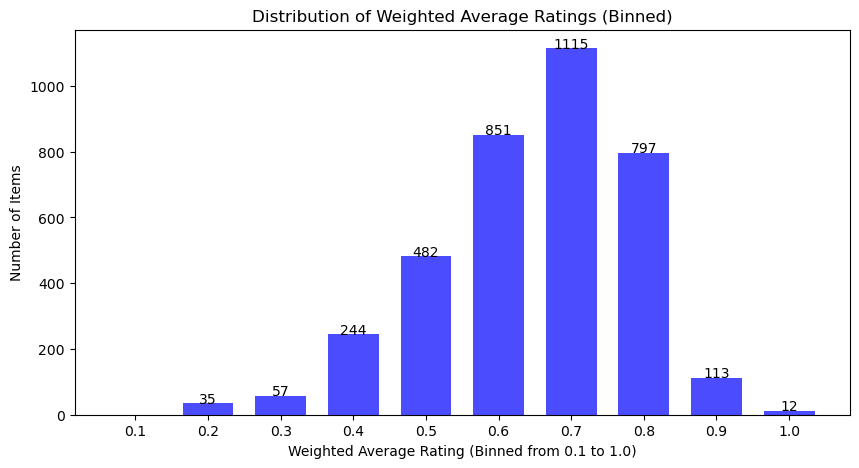

In [12]:
# Assuming user_groups is already defined
cluster_item_ratings = compute_cluster_ratings(df, user_groups)  # Step 1: Compute initial ratings

print("cluster_item_ratings: ", cluster_item_ratings)

cluster_item_ratings_reputation, reputations_by_cluster = compute_reputation_adjusted_ratings_optimized(df, cluster_item_ratings, user_groups)
print("reputationByCluster: ",reputations_by_cluster)
print("cluster_item_ratings_reputation: ", cluster_item_ratings_reputation)

weighted_average_dict = compute_weighted_average_cluster_ratings(cluster_item_ratings_reputation, user_groups)

# round all clusters values 
rounded_ratings = round_ratings_to_one_decimal(cluster_item_ratings_reputation)

print("rounded_ratings: ", rounded_ratings)
print("len(rounded_ratings): ", len(rounded_ratings))

plot_top_3_clusters(rounded_ratings)  # Use actual dictionary
plot_weighted_average_distribution(weighted_average_dict)  # Use actual computed weighted averages




**11. Demographics**

In [13]:
from collections import defaultdict

# Define age ranges with lambda checks
age_ranges = {
    "< 18": lambda age: age < 18,
    "18-24": lambda age: 18 <= age <= 24,
    "25-34": lambda age: 25 <= age <= 34,
    "35-44": lambda age: 35 <= age <= 44,
    "45-54": lambda age: 45 <= age <= 54,
    ">= 55": lambda age: age >= 55,
}

# Initialize dictionaries with sets as default values
gender_groups = defaultdict(set)
age_groups = defaultdict(set)

file_path = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/users.dat"

with open(file_path, 'r') as file:
    for line in file:
        # Strip newline and split using the '::' delimiter
        parts = line.strip().split("::")
        if len(parts) != 5:
            continue  # Skip malformed lines

        user_id, gender, age_str, _, _ = parts

        user_id = int(user_id)
        age = int(age_str)

        # Match age to a range label
        for label, condition in age_ranges.items():
            if condition(age):
                age_groups[label].add(user_id)
                break  # Stop once matched

        # Gender grouping
        gender_groups[gender].add(user_id)

# Example: Print sizes of each group
print(f"Gender Groups: {gender_groups}") 

print(f"\nAge Groups: {age_groups}")


Gender Groups: defaultdict(<class 'set'>, {'F': {1, 6, 10, 11, 16, 18, 24, 28, 30, 32, 34, 37, 38, 41, 45, 50, 51, 55, 59, 62, 67, 69, 72, 75, 78, 79, 81, 83, 86, 88, 89, 92, 96, 97, 98, 99, 101, 106, 114, 119, 122, 127, 133, 137, 139, 140, 146, 151, 156, 159, 162, 164, 167, 168, 171, 175, 176, 183, 184, 187, 193, 194, 196, 200, 201, 203, 210, 213, 219, 221, 224, 233, 238, 242, 246, 249, 253, 262, 263, 265, 268, 277, 281, 285, 288, 289, 290, 294, 298, 305, 310, 312, 313, 314, 315, 318, 319, 325, 334, 340, 341, 343, 346, 347, 353, 358, 361, 364, 365, 372, 373, 374, 378, 379, 382, 383, 387, 388, 399, 400, 410, 411, 415, 417, 418, 421, 428, 430, 434, 446, 447, 455, 459, 464, 467, 468, 470, 473, 475, 480, 484, 487, 494, 497, 499, 500, 507, 511, 516, 517, 518, 519, 520, 527, 528, 531, 541, 546, 548, 556, 559, 561, 568, 569, 573, 576, 583, 584, 588, 590, 593, 594, 596, 601, 602, 603, 605, 606, 617, 619, 625, 628, 629, 630, 634, 641, 642, 648, 655, 656, 657, 658, 659, 663, 666, 668, 687, 689,

**12. Metrics**

**12.1 Effectiveness**

In [14]:
def compute_kendall_tau(ranking_1, ranking_2):
    common_items = set(ranking_1.keys()) & set(ranking_2.keys())  # Compare only common items
    
    if len(common_items) < 2:
        return 0  # Need at least two items to compute Kendall's tau
    
    sorted_items = sorted(common_items)  # Ensure consistent order
    
    list_1 = [ranking_1[item] for item in sorted_items]
    list_2 = [ranking_2[item] for item in sorted_items]
    
    return kendalltau(list_1, list_2).correlation

def compute_weighted_kendall_tau(cluster_item_ratings, user_groups):
    
    weighted_tau_sum = 0
    total_weight = sum(len(users) for users in user_groups)  # Total number of users as weight

    for cluster_id, item_ratings in cluster_item_ratings.items():
        tau_cluster = compute_kendall_tau(item_ratings, cluster_item_ratings_reputation[cluster_id])
        print(f"tau_cluster: {tau_cluster}")

        cluster_size = len(user_groups[cluster_id - 1])  # Cluster size as weight
        
        weighted_tau_sum += cluster_size * tau_cluster
    
    return weighted_tau_sum / total_weight if total_weight > 0 else 0

weighted_tau = compute_weighted_kendall_tau(cluster_item_ratings, user_groups)
print(f"Weighted Kendall’s τ: {weighted_tau:.4f}")


tau_cluster: 0.9699456202268437
tau_cluster: 0.9760273494829157
tau_cluster: 0.9654393509102746
tau_cluster: 0.9588036384904268
tau_cluster: 0.9705948137160946
tau_cluster: 0.9747233197937958
tau_cluster: 0.9651714483248613
tau_cluster: 0.9679654558452983
tau_cluster: 0.9905997587072033
Weighted Kendall’s τ: 0.9896


**11.2 Bias**

In [15]:
def demographic_bias(demographic_group_users, cluster_reputations):
    """
    Compute demographic reputation gap per cluster and aggregate with weighted average.

    Args:
        demographic_group_users (set): Users in the selected demographic group.
        cluster_reputations (dict): {cluster_idx: {user_id: reputation}}

    Returns:
        cluster_gaps (dict): {cluster_idx: gap}
        weighted_avg_gap (float): Weighted average of gaps across clusters
    """
    cluster_gaps = {}
    cluster_weights = {}

    for cluster_idx, users_in_cluster in enumerate(user_groups, start=1):  # cluster indices start at 1
        reputations = cluster_reputations.get(cluster_idx, {})
        users_in_cluster = set(users_in_cluster)
        
        # Split target and complementary users within the cluster
        target_users = demographic_group_users & users_in_cluster
        complementary_users = users_in_cluster - target_users

        target_reps = [reputations[u] for u in target_users if u in reputations]
        comp_reps = [reputations[u] for u in complementary_users if u in reputations]

        # Compute gap only if both sides have data
        if target_reps and comp_reps:
            target_avg = sum(target_reps) / len(target_reps)
            comp_avg = sum(comp_reps) / len(comp_reps)
            gap = target_avg - comp_avg
        else:
            gap = 0.0  # Neutral if there's no sufficient data

        cluster_gaps[cluster_idx] = gap
        cluster_weights[cluster_idx] = len(users_in_cluster)

    # Compute weighted average gap across clusters
    total_weight = sum(cluster_weights.values())
    weighted_avg_gap = sum(
        cluster_gaps[c] * cluster_weights[c] for c in cluster_gaps
    ) / total_weight if total_weight > 0 else 0

    return cluster_gaps, weighted_avg_gap


# --------------------------------------------------
# GENDER GROUP GAPS
print("=== Gender-Based Reputation Gaps ===")
cluster_bias, weighted_bias = demographic_bias(gender_groups["F"], reputations_by_cluster)
print(f"Reputation gap (Female vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(gender_groups["M"], reputations_by_cluster)
print(f"Reputation gap (Male vs rest): ", weighted_bias)


# --------------------------------------------------
# AGE GROUP GAPS
print("\n=== Age-Based Reputation Gaps ===")
cluster_bias, weighted_bias = demographic_bias(age_groups["< 18"], reputations_by_cluster)
print(f"Reputation gap (< 18 vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(age_groups["18-24"], reputations_by_cluster)
print(f"Reputation gap (18-24 vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(age_groups["25-34"], reputations_by_cluster)
print(f"Reputation gap (25-34 vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(age_groups["35-44"], reputations_by_cluster)
print(f"Reputation gap (35-44 vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(age_groups["45-54"], reputations_by_cluster)
print(f"Reputation gap (45-54 vs rest): ", weighted_bias)
cluster_bias, weighted_bias = demographic_bias(age_groups[">= 55"], reputations_by_cluster)
print(f"Reputation gap (>= 55 vs rest): ", weighted_bias)

=== Gender-Based Reputation Gaps ===
Reputation gap (Female vs rest):  -0.004691655294813944
Reputation gap (Male vs rest):  0.004691655294813944

=== Age-Based Reputation Gaps ===
Reputation gap (< 18 vs rest):  -0.025332820286615435
Reputation gap (18-24 vs rest):  -0.01036570547926659
Reputation gap (25-34 vs rest):  0.002174580881498584
Reputation gap (35-44 vs rest):  0.006064998558890415
Reputation gap (45-54 vs rest):  0.004682089611293327
Reputation gap (>= 55 vs rest):  0.005620294383472427


**11.3. Robustness**

In [16]:
import os

# Directory where your spam-injected files are located
spam_dir = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/spam_versions"

# Spam ratios you want to evaluate
ratios = [10, 30, 50, 70]
i = 0

while i < len(ratios):
    percent = ratios[i]
    file_name = f"ratings_with_{percent}percent_spam.csv"
    file_path = os.path.join(spam_dir, file_name)

    # Load the dataset
    df_attack = pd.read_csv(file_path)
    df_attack.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp', 'NormalizedRating']

    user_ratingsSpam = {user: dict(zip(group["MovieID"], group["NormalizedRating"])) for user, group in df_attack.groupby("UserID")}

    compressed_sizesSpam = compute_compressed_sizes(user_ratingsSpam)
    
    similarity_graphSpam = compute_similarity_matrix(user_ratingsSpam, kolmogorov_similarity, compressed_sizesSpam, 0.9)

    # Get threshold for complementary cluster
    num_users = df_attack["UserID"].nunique()
    complementary_cluster_threshold = num_users * 0.005

    # Detect user clusters from similarity graph
    user_groupsSpam = detect_groups(similarity_graphSpam, complementary_cluster_threshold)

    cluster_item_ratingsSpam = compute_cluster_ratings(df_attack, user_groupsSpam)  # Step 1: Compute initial ratings

    cluster_item_ratings_reputationSpam, reputations_by_clusterSpam = compute_reputation_adjusted_ratings_optimized(df_attack, cluster_item_ratingsSpam, user_groupsSpam)

    weighted_average_dictSpam = compute_weighted_average_cluster_ratings(cluster_item_ratings_reputationSpam, user_groupsSpam)

    print("weighted_average_dictSpam: ", weighted_average_dictSpam)
    # Compute Kendall's tau
    tau_value = compute_kendall_tau(weighted_average_dict, weighted_average_dictSpam)

    # Print the result
    print(f"[{percent}% Spam] Kendall’s τ: {tau_value:.4f}")
    
    i += 1




KeyboardInterrupt: 

**11.4. Bribery Resistance**

In [30]:
import pandas as pd
import os

# === Load original dataset ===
original_path = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/normalized_ratings.dat"
original_df = pd.read_csv(original_path, sep="::", engine="python",
                          names=["UserID", "MovieID", "Rating", "Timestamp", "NormalizedRating"])

# === Define target items ===
target_items = [2858]

# === Clustering on original dataset ===
user_ratings_dict = {
    user: dict(zip(group["MovieID"], group["NormalizedRating"]))
    for user, group in original_df.groupby("UserID")
}
compressed_sizes = compute_compressed_sizes(user_ratings_dict)
similarity_graph = compute_similarity_matrix(user_ratings_dict, kolmogorov_similarity, compressed_sizes, 0.9)
threshold = original_df["UserID"].nunique() * 0.005
user_groups = detect_groups(similarity_graph, threshold)

# === Compute original cluster ratings and wealth ===
cluster_item_ratings = compute_cluster_ratings(original_df, user_groups)
cluster_item_ratings_reputation, _ = compute_reputation_adjusted_ratings_optimized(
    original_df, cluster_item_ratings, user_groups
)
original_cluster_item_counts = compute_cluster_item_counts(original_df, user_groups, target_items)
original_wealths = {
    item: compute_cluster_wealth(cluster_item_ratings_reputation, item, original_cluster_item_counts)
    for item in target_items
}

print("\n📊 Original Multipartite Wealths:")
for item, wealth in original_wealths.items():
    print(f"Item {item}: {wealth:.4f}")

# === Evaluate each item's attack scenarios ===
base_folder = "/home/martimsbaltazar/Desktop/tese/datasets/ml-1m/bribery_attack_sets"
results = []

for target_item in target_items:
    item_folder = os.path.join(base_folder, f"item_{target_item}")

    for fname in os.listdir(item_folder):
        if not fname.endswith(".csv"):
            continue

        scenario_name = fname.replace(".csv", "")
        full_path = os.path.join(item_folder, fname)
        altered_df = pd.read_csv(full_path)

        # Strategy cost
        txt_path = os.path.join(item_folder, scenario_name + "_changes.txt")
        strategy_cost = 0.0
        if os.path.exists(txt_path):
            strategy_cost = parse_strategy_cost(txt_path, scale_by_user="new" in scenario_name.lower())

        # Recompute clustering on altered dataset
        altered_user_ratings = {
            user: dict(zip(group["MovieID"], group["NormalizedRating"]))
            for user, group in altered_df.groupby("UserID")
        }
        compressed_sizes_altered = compute_compressed_sizes(altered_user_ratings)
        similarity_graph_altered = compute_similarity_matrix(
            altered_user_ratings, kolmogorov_similarity, compressed_sizes_altered, 0.9
        )
        threshold_altered = altered_df["UserID"].nunique() * 0.005
        user_groups_altered = detect_groups(similarity_graph_altered, threshold_altered)

        # Compute updated ratings and wealth
        cluster_item_ratings = compute_cluster_ratings(altered_df, user_groups_altered)
        cluster_item_ratings_reputation, _ = compute_reputation_adjusted_ratings_optimized(
            altered_df, cluster_item_ratings, user_groups_altered
        )
        rounded_ratings = round_ratings_to_one_decimal(cluster_item_ratings_reputation)
        cluster_item_counts = compute_cluster_item_counts(altered_df, user_groups_altered, [target_item])

        attacked_wealth = compute_cluster_wealth(rounded_ratings, target_item, cluster_item_counts)
        delta = attacked_wealth - original_wealths[target_item] - strategy_cost

        results.append({
            "ItemID": target_item,
            "Scenario": scenario_name,
            "OriginalWealth": original_wealths[target_item],
            "AttackedWealth": attacked_wealth,
            "StrategyCost": strategy_cost,
            "Delta": delta
        })

        print(f"✅ Attack simulated for item: {target_item} in scenario: {scenario_name}")
        print("user_groups_altered: ", user_groups_altered)
# === Compile and print results ===
results_df = pd.DataFrame(results)
print("\n📋 All Attack Scenarios with Strategy Cost:")
print(results_df.to_string(index=False))

# === Compute total sum of absolute delta per item ===
results_df["AbsDelta"] = results_df["Delta"].abs()
sum_abs_deltas = results_df.groupby("ItemID")["AbsDelta"].sum().reset_index()
sum_abs_deltas.rename(columns={"AbsDelta": "TotalAbsDelta"}, inplace=True)

print("\n📊 Total Sum of |Delta| per Item (Net of Strategy Cost):")
print(sum_abs_deltas.to_string(index=False))


Cluster 1 - Item 2858: Avg Rating = 0.9537163279661139, Num Ratings = 13, Wealth Contribution = 12.39831226355948
Cluster 2 - Item 2858: Avg Rating = 0.9011160562404048, Num Ratings = 10, Wealth Contribution = 9.011160562404047
Cluster 3 - Item 2858: Avg Rating = 0.8024422210884502, Num Ratings = 16, Wealth Contribution = 12.839075537415203
Cluster 4 - Item 2858: Avg Rating = 0.7819665967557187, Num Ratings = 12, Wealth Contribution = 9.383599161068624
Cluster 5 - Item 2858: Avg Rating = 0.8602553508362843, Num Ratings = 10, Wealth Contribution = 8.602553508362844
Cluster 6 - Item 2858: Avg Rating = 0.8463763317961083, Num Ratings = 13, Wealth Contribution = 11.002892313349408
Cluster 7 - Item 2858: Avg Rating = 0.8615568381936137, Num Ratings = 10, Wealth Contribution = 8.615568381936137
Cluster 8 - Item 2858: Avg Rating = 0.9148806429529689, Num Ratings = 7, Wealth Contribution = 6.404164500670782
Cluster 9 - Item 2858: Avg Rating = 0.8648212384798912, Num Ratings = 3337, Wealth Cont

**11.4. Bribery Resistance aux functions**

In [27]:

def compute_cluster_item_counts(df, user_groups, target_items):
    """
    Returns a dictionary: {cluster_id: {item_id: rating count}}
    Only includes counts for the given target_items.
    """
    cluster_item_counts = {}
    for i, group in enumerate(user_groups):
        cluster_df = df[df["UserID"].isin(group)]
        item_counts = (
            cluster_df[cluster_df["MovieID"].isin(target_items)]
            .groupby("MovieID").size().to_dict()
        )
        cluster_item_counts[i] = item_counts
    return cluster_item_counts


def compute_cluster_wealth(cluster_ratings: dict, item_id: int, cluster_item_counts: dict) -> float:
    wealth = 0.0
    for cluster_id, item_dict in cluster_ratings.items():
        
        if item_id in item_dict:
            avg_rating = item_dict[item_id]
            num_ratings = cluster_item_counts.get(cluster_id - 1, {}).get(item_id, 0)
            wealth += num_ratings * avg_rating
        print(f"Cluster {cluster_id} - Item {item_id}: Avg Rating = {avg_rating}, Num Ratings = {num_ratings}, Wealth Contribution = {num_ratings * avg_rating}")
    print(f"Total Wealth for Item {item_id}: {wealth}")
    return wealth


# === Helper: Strategy cost parser ===
def parse_strategy_cost(txt_path, scale_by_user=False):
    total_cost = 0.0
    user_ids = set()

    with open(txt_path, "r") as f:
        for line in f:
            if "UserID" in line and "Old" in line and "New" in line:
                try:
                    parts = line.strip().split(", ")
                    user_id = int(parts[0].split(": ")[1])
                    old_val = parts[1].split(": ")[1]
                    new_val = parts[2].split(": ")[1]
                    old = float(old_val) if old_val != "None" else 0.0
                    new = float(new_val) if new_val != "None" else 0.0
                    user_ids.add(user_id)
                    total_cost += abs(new - old)
                except Exception as e:
                    print(f"⚠️ Error parsing line: {line.strip()} → {e}")
    #alter to the multiplication factor
    if scale_by_user:
        total_cost *= 1
    return total_cost


